Hello Kagglers! It has been a while since I made a new kernel. The last kernel was on [Kaggle Survey Challenge 2018](https://www.kaggle.com/aakashnain/is-it-better-than-2017/). 

Today, we are going to deep dive into `Model Interpretability`. Machine learning models, especially **Deep Learning** models are often considered as a black box and hard to interpret. Well, this statement is neither completely true not it is completely false. It is a fact that debugging a deep learning model is way harder than other machine learning models but there are ways by which you can get `insights` about your model and to an extent, you can see what is happening.  Let's get started.   

![Do you have any idea what are you doin?](http://media.giphy.com/media/SRx5tBBrTQOBi/giphy.gif)

<a id="contents"></a>
# Contents
1. [Import the required libraries](#imports).
2. [Do everything we can to make our results reproducible](#reproducibility) <br>
3. [Load dataset and process it](#dataloading)<br>
4. [Data Augmentation](#augmentation) <br>
5. [Data Generator](#data-gen)<br>
6. [Modelling](#modelling)<br>
7. [Model Interpretability](#interpretability)<br>
8. [Conclusion](#conclusion)<br>

<a id='Imports'></a>
## 1. Import the required libraries

In [1]:
import os
import cv2
import glob
import h5py
import shutil
import imgaug as aug
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import imgaug.augmenters as iaa
from os import listdir, makedirs, getcwd, remove
from os.path import isfile, join, abspath, exists, isdir, expanduser
from pathlib import Path
from skimage.io import imread
from skimage.transform import resize
from keras.models import Sequential, Model, load_model
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.layers import Conv2D, MaxPooling2D, Dense, Dropout, Input, Flatten
from keras.optimizers import Adam, SGD, RMSprop
from keras.callbacks import ModelCheckpoint, Callback, EarlyStopping
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix
from keras import backend as K
import tensorflow as tf


color = sns.color_palette()
%matplotlib inline
%config InlineBackend.figure_format="svg"

Using TensorFlow backend.


<a id='reproducibility'></a>
## 2. Do everything we can to make our results reproducible

Thumb rule: **Always set the seed!**

In [2]:
# Set the seed for hash based operations in python
os.environ['PYTHONHASHSEED'] = '0'

seed=1234

# Set the numpy seed
np.random.seed(seed)

# Set the random seed in tensorflow at graph level
tf.set_random_seed(seed)

# Make the augmentation sequence deterministic
aug.seed(seed)

<a id='dataloading'></a>
## 3. Load dataset and process it

In [3]:
# As usual, define some paths first to make life simpler
training_data = Path('../input/training/training/') 
validation_data = Path('../input/validation/validation/') 
labels_path = Path('../input/monkey_labels.txt')

We will read the `monkey_labels.txt` file to extract the information about the labels. We can store this information in a list which then can be converted into a `pandas` dataframe.  

In [4]:
labels_info = []

# Read the file
lines = labels_path.read_text().strip().splitlines()[1:]
for line in lines:
    line = line.split(',')
    line = [x.strip(' \n\t\r') for x in line]
    line[3], line[4] = int(line[3]), int(line[4])
    line = tuple(line)
    labels_info.append(line)
    
# Convert the data into a pandas dataframe
labels_info = pd.DataFrame(labels_info, columns=['Label', 'Latin Name', 'Common Name', 
                                                 'Train Images', 'Validation Images'], index=None)
# Sneak peek 
labels_info.head(10)

,Label,Latin Name,Common Name,Train Images,Validation Images
0,n0,alouatta_palliata,mantled_howler,131,26
1,n1,erythrocebus_patas,patas_monkey,139,28
2,n2,cacajao_calvus,bald_uakari,137,27
3,n3,macaca_fuscata,japanese_macaque,152,30
4,n4,cebuella_pygmea,pygmy_marmoset,131,26
5,n5,cebus_capucinus,white_headed_capuchin,141,28
6,n6,mico_argentatus,silvery_marmoset,132,26
7,n7,saimiri_sciureus,common_squirrel_monkey,142,28
8,n8,aotus_nigriceps,black_headed_night_monkey,133,27
9,n9,trachypithecus_johnii,nilgiri_langur,132,26


The labels are `n0, n1, n2, ...`. We will create a mapping of these labels where each class will be represented by an integer starting from 0 to number of classes. We will also create a mapping for the names corresponding to a class. We will be using `Common Name` for the last part

In [5]:
# Create a dictionary to map the labels to integers
labels_dict= {'n0':0, 'n1':1, 'n2':2, 'n3':3, 'n4':4, 'n5':5, 'n6':6, 'n7':7, 'n8':8, 'n9':9}

# map labels to common names
names_dict = dict(zip(labels_dict.values(), labels_info["Common Name"]))
print(names_dict)

{0: 'mantled_howler', 1: 'patas_monkey', 2: 'bald_uakari', 3: 'japanese_macaque', 4: 'pygmy_marmoset', 5: 'white_headed_capuchin', 6: 'silvery_marmoset', 7: 'common_squirrel_monkey', 8: 'black_headed_night_monkey', 9: 'nilgiri_langur'}


This is a very small dataset. You can load the data into `numpy arrays` which then can be directly used for training. But this isn't always the scenario. Most of the time you won't be able to load the entire dataset in the memory. This is why I always store information about the dataset in dataframes and then use a generator to load the data on the fly. We will be doing the same thing here. 

In [6]:
# Creating a dataframe for the training dataset
train_df = []
for folder in os.listdir(training_data):
    # Define the path to the images
    imgs_path = training_data / folder
    
    # Get the list of all the images stored in that directory
    imgs = sorted(imgs_path.glob('*.jpg'))
    
    # Store each image path and corresponding label 
    for img_name in imgs:
        train_df.append((str(img_name), labels_dict[folder]))


train_df = pd.DataFrame(train_df, columns=['image', 'label'], index=None)
# shuffle the dataset 
train_df = train_df.sample(frac=1.).reset_index(drop=True)

####################################################################################################

# Creating dataframe for validation data in a similar fashion
valid_df = []
for folder in os.listdir(validation_data):
    imgs_path = validation_data / folder
    imgs = sorted(imgs_path.glob('*.jpg'))
    for img_name in imgs:
        valid_df.append((str(img_name), labels_dict[folder]))

        
valid_df = pd.DataFrame(valid_df, columns=['image', 'label'], index=None)
# shuffle the dataset 
valid_df = valid_df.sample(frac=1.).reset_index(drop=True)

####################################################################################################

# How many samples do we have in our training and validation data?
print("Number of traininng samples: ", len(train_df))
print("Number of validation samples: ", len(valid_df))

# sneak peek of the training and validation dataframes
print("\n",train_df.head(), "\n")
print("=================================================================\n")
print("\n", valid_df.head())

Number of traininng samples:  1096
Number of validation samples:  272

                                      image  label
0  ../input/training/training/n6/n6116.jpg      6
1  ../input/training/training/n0/n0026.jpg      0
2  ../input/training/training/n7/n7145.jpg      7
3  ../input/training/training/n0/n0118.jpg      0
4  ../input/training/training/n6/n6132.jpg      6 



                                          image  label
0   ../input/validation/validation/n8/n819.jpg      8
1  ../input/validation/validation/n0/n0014.jpg      0
2  ../input/validation/validation/n8/n8012.jpg      8
3   ../input/validation/validation/n5/n511.jpg      5
4   ../input/validation/validation/n5/n508.jpg      5


In [7]:
# some constants(not truly though!) 

# dimensions to consider for the images
img_rows, img_cols, img_channels = 224,224,3

# batch size for training  
batch_size=8

# total number of classes in the dataset
nb_classes=10

<a id="augmentation"></a>
## 4. Data Augmentation

When you have limited data, deep models don't do very well. Deep learning models are **data hungry**. The more data you provide to a deep learning model, the more it performance improves (until unless your algorithm has reached a limit). This is where `data augmentation` really comes handy. We will be using [imgaug](https://github.com/aleju/imgaug), a very powerful library for augmenting our images. We will define a sequence of augmentations and for each image, one of these augmentations will be applied to the image during training 

In [8]:
# Augmentation sequence 
seq = iaa.OneOf([
    iaa.Fliplr(), # horizontal flips
    iaa.Affine(rotate=20), # roatation
    iaa.Multiply((1.2, 1.5))]) #random brightness

<a id="data-gen"></a>
## 5. Data Generator

In [9]:
def data_generator(data, batch_size, is_validation_data=False):
    # Get total number of samples in the data
    n = len(data)
    nb_batches = int(np.ceil(n/batch_size))

    # Get a numpy array of all the indices of the input data
    indices = np.arange(n)
    
    # Define two numpy arrays for containing batch data and labels
    batch_data = np.zeros((batch_size, img_rows, img_cols, img_channels), dtype=np.float32)
    batch_labels = np.zeros((batch_size, nb_classes), dtype=np.float32)
    
    while True:
        if not is_validation_data:
            # shuffle indices for the training data
            np.random.shuffle(indices)
            
        for i in range(nb_batches):
            # get the next batch 
            next_batch_indices = indices[i*batch_size:(i+1)*batch_size]
            
            # process the next batch
            for j, idx in enumerate(next_batch_indices):
                img = cv2.imread(data.iloc[idx]["image"])
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                label = data.iloc[idx]["label"]
                
                if not is_validation_data:
                    img = seq.augment_image(img)
                
                img = cv2.resize(img, (img_rows, img_cols)).astype(np.float32)
                batch_data[j] = img
                batch_labels[j] = to_categorical(label,num_classes=nb_classes)
            
            batch_data = preprocess_input(batch_data)
            yield batch_data, batch_labels

In [10]:
#training data generator 
train_data_gen = data_generator(train_df, batch_size)

# validation data generator 
valid_data_gen = data_generator(valid_df, batch_size, is_validation_data=True)

<a id="model"></a>
## 6. Modelling

We will be doing **transfer learning** here and I am choosing `vgg16` as the base network. You can choose whichever network you want.
Also, as the dataset is very small and very very similar to Imagenet, we would make minimal changes in the network to keep the trainable parameters as few as possible  

In [11]:
# simple function that returns the base model
def get_base_model():
    base_model = VGG16(input_shape=(img_rows, img_cols, img_channels), weights='imagenet', include_top=True)
    return base_model

In [12]:
# get the base model
base_model = get_base_model()

#  get the output of the second last dense layer 
base_model_output = base_model.layers[-2].output

# add new layers 
x = Dropout(0.7,name='drop2')(base_model_output)
output = Dense(10, activation='softmax', name='fc3')(x)

# define a new model 
model = Model(base_model.input, output)

# Freeze all the base model layers 
for layer in base_model.layers[:-1]:
    layer.trainable=False

# compile the model and check it 
optimizer = RMSprop(0.001)
model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
model.summary()

553467904/553467096 [==============================] - 6s 0us/step
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_po

In [13]:
# always user earlystopping
# the restore_best_weights parameter load the weights of the best iteration once the training finishes
es = EarlyStopping(patience=10, restore_best_weights=True)

# checkpoint to save model
chkpt = ModelCheckpoint(filepath="model1", save_best_only=True)

# number of training and validation steps for training and validation
nb_train_steps = int(np.ceil(len(train_df)/batch_size))
nb_valid_steps = int(np.ceil(len(valid_df)/batch_size))

# number of epochs 
nb_epochs=100

In [14]:
# train the model 
history1 = model.fit_generator(train_data_gen, 
                              epochs=nb_epochs, 
                              steps_per_epoch=nb_train_steps, 
                              validation_data=valid_data_gen, 
                              validation_steps=nb_valid_steps,
                              callbacks=[es,chkpt])

Epoch 1/100
137/137 [==============================] - 55s 404ms/step - loss: 1.6232 - acc: 0.6651 - val_loss: 0.2767 - val_acc: 0.9118
Epoch 2/100
137/137 [==============================] - 49s 356ms/step - loss: 0.3557 - acc: 0.9088 - val_loss: 0.1648 - val_acc: 0.9559
Epoch 3/100
137/137 [==============================] - 47s 346ms/step - loss: 0.2923 - acc: 0.9334 - val_loss: 0.1725 - val_acc: 0.9559
Epoch 4/100
137/137 [==============================] - 48s 349ms/step - loss: 0.2275 - acc: 0.9489 - val_loss: 0.2278 - val_acc: 0.9632
Epoch 5/100
137/137 [==============================] - 47s 346ms/step - loss: 0.1782 - acc: 0.9571 - val_loss: 0.2990 - val_acc: 0.9412
Epoch 6/100
137/137 [==============================] - 49s 357ms/step - loss: 0.1409 - acc: 0.9681 - val_loss: 0.1481 - val_acc: 0.9596
Epoch 7/100
137/137 [==============================] - 49s 358ms/step - loss: 0.1437 - acc: 0.9690 - val_loss: 0.1304 - val_acc: 0.9669
Epoch 8/100
137/137 [===========================

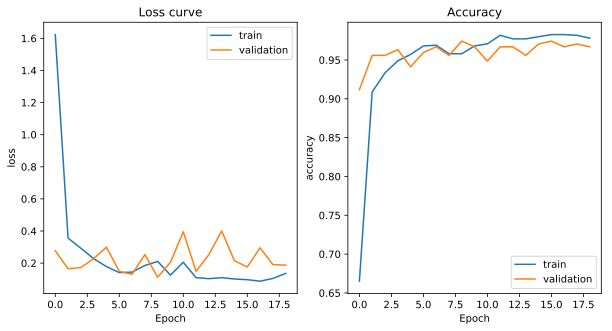

In [15]:
# let's plot the loss and accuracy 

# get the training and validation accuracy from the history object
train_acc = history1.history['acc']
valid_acc = history1.history['val_acc']

# get the loss
train_loss = history1.history['loss']
valid_loss = history1.history['val_loss']

# get the number of entries
xvalues = np.arange(len(train_acc))

# visualize
f,ax = plt.subplots(1,2, figsize=(10,5))
ax[0].plot(xvalues, train_loss)
ax[0].plot(xvalues, valid_loss)
ax[0].set_title("Loss curve")
ax[0].set_xlabel("Epoch")
ax[0].set_ylabel("loss")
ax[0].legend(['train', 'validation'])

ax[1].plot(xvalues, train_acc)
ax[1].plot(xvalues, valid_acc)
ax[1].set_title("Accuracy")
ax[1].set_xlabel("Epoch")
ax[1].set_ylabel("accuracy")
ax[1].legend(['train', 'validation'])

plt.show()

In [16]:
# What is the final loss and accuracy on our validation data?
valid_loss, valid_acc = model.evaluate_generator(valid_data_gen, steps=nb_valid_steps)
print(f"Final validation accuracy: {valid_acc*100:.2f}%")

Final validation accuracy: 98.53%


<a id='interpretability'></a>
## 7. Model Interpretability

Now starts the most important part. How do we explain the output of our model? For example, given an image, what does the network consider important when classifying the image? Can we get info about it? Can we make our model a little `grey box`? LOL!

Answering the above question is a bit difficult. Although there have been many advancements in explaining the activations/outputs of a neural network, for example, check [this](https://distill.pub/2018/building-blocks/), a lot more has to be done in this direction.

Here, we will explore two methods that are very simple to use and can give some good insights about model predictions. These are:
* **Visualizing the intermediate layers outputs**
* **[Class Activation Mapping](http://cnnlocalization.csail.mit.edu/)**


Here are all the steps we are going to do: 
* We will start by selecting all the layers up to last `convolution block` in VGG16, excluding the `Input layer`.
* Define a new model, `vis_model`, that takes the same input as our model's input but outputs activations of all the intermediate layers we have selected. This will be used for displaying all the activation maps of each convolution block for any sample image from our validation data. Check `visualize_intermediate_activations()` function for more details. 
*  For `CAM`, we will take the same sample image and get the output of the `last convolution layer`. We also compute the gradients for this layer which we will use to generate a heatmap. See the `get_CAM()` function for details.


In [17]:
# select all the layers for which you want to visualize the outputs and store it in a list
outputs = [layer.output for layer in model.layers[1:18]]

# Define a new model that generates the above output
vis_model = Model(model.input, outputs)

# check if we have all the layers we require for visualization 
vis_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

Perfect! Store the names of all these intermediate layers in a list. We will use the names during visualizations of these activation maps 

In [18]:
# store the layer names we are interested in
layer_names = []
for layer in outputs:
    layer_names.append(layer.name.split("/")[0])

    
print("Layers going to be used for visualization: ")
print(layer_names)

Layers going to be used for visualization: 
['block1_conv1', 'block1_conv2', 'block1_pool', 'block2_conv1', 'block2_conv2', 'block2_pool', 'block3_conv1', 'block3_conv2', 'block3_conv3', 'block3_pool', 'block4_conv1', 'block4_conv2', 'block4_conv3', 'block4_pool', 'block5_conv1', 'block5_conv2', 'block5_conv3']


In [19]:
def get_CAM(processed_image, predicted_label):
    """
    This function is used to generate a heatmap for a sample image prediction.
    
    Args:
        processed_image: any sample image that has been pre-processed using the 
                       `preprocess_input()`method of a keras model
        predicted_label: label that has been predicted by the network for this image
    
    Returns:
        heatmap: heatmap generated over the last convolution layer output 
    """
    # we want the activations for the predicted label
    predicted_output = model.output[:, predicted_label]
    
    # choose the last conv layer in your model
    last_conv_layer = model.get_layer('block5_conv3')
    
    # get the gradients wrt to the last conv layer
    grads = K.gradients(predicted_output, last_conv_layer.output)[0]
    
    # take mean gradient per feature map
    grads = K.mean(grads, axis=(0,1,2))
    
    # Define a function that generates the values for the output and gradients
    evaluation_function = K.function([model.input], [grads, last_conv_layer.output[0]])
    
    # get the values
    grads_values, conv_ouput_values = evaluation_function([processed_image])
    
    # iterate over each feature map in yout conv output and multiply
    # the gradient values with the conv output values. This gives an 
    # indication of "how important a feature is"
    for i in range(512): # we have 512 features in our last conv layer
        conv_ouput_values[:,:,i] *= grads_values[i]
    
    # create a heatmap
    heatmap = np.mean(conv_ouput_values, axis=-1)
    
    # remove negative values
    heatmap = np.maximum(heatmap, 0)
    
    # normalize
    heatmap /= heatmap.max()
    
    return heatmap

In [20]:
def show_random_sample(idx):
    """
    This function is used to select a random sample from the validation dataframe.
    It generates prediction for the same. It also stores the heatmap and the intermediate
    layers activation maps.
    
    Arguments:
        idx: random index to select a sample from validation data
    
    Returns:
        activations: activation values for intermediate layers
    """
    # select the sample and read the corresponding image and label
    sample_image = cv2.imread(valid_df.iloc[idx]['image'])
    sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)
    sample_image = cv2.resize(sample_image, (img_rows, img_cols))
    sample_label = valid_df.iloc[idx]["label"]
    
    # pre-process the image
    sample_image_processed = np.expand_dims(sample_image, axis=0)
    sample_image_processed = preprocess_input(sample_image_processed)
    
    # generate activation maps from the intermediate layers using the visualization model
    activations = vis_model.predict(sample_image_processed)
    
    # get the label predicted by our original model
    pred_label = np.argmax(model.predict(sample_image_processed), axis=-1)[0]
    
    # choose any random activation map from the activation maps 
    sample_activation = activations[0][0,:,:,32]
    
    # normalize the sample activation map
    sample_activation-=sample_activation.mean()
    sample_activation/=sample_activation.std()
    
    # convert pixel values between 0-255
    sample_activation *=255
    sample_activation = np.clip(sample_activation, 0, 255).astype(np.uint8)
    
    
    
    # get the heatmap for class activation map(CAM)
    heatmap = get_CAM(sample_image_processed, pred_label)
    heatmap = cv2.resize(heatmap, (sample_image.shape[0], sample_image.shape[1]))
    heatmap = heatmap *255
    heatmap = np.clip(heatmap, 0, 255).astype(np.uint8)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    super_imposed_image = heatmap * 0.5 + sample_image
    super_imposed_image = np.clip(super_imposed_image, 0,255).astype(np.uint8)

    f,ax = plt.subplots(2,2, figsize=(15,8))
    ax[0,0].imshow(sample_image)
    ax[0,0].set_title(f"True label: {sample_label} \n Predicted label: {pred_label}")
    ax[0,0].axis('off')
    
    ax[0,1].imshow(sample_activation)
    ax[0,1].set_title("Random feature map")
    ax[0,1].axis('off')
    
    ax[1,0].imshow(heatmap)
    ax[1,0].set_title("Class Activation Map")
    ax[1,0].axis('off')
    
    ax[1,1].imshow(super_imposed_image)
    ax[1,1].set_title("Activation map superimposed")
    ax[1,1].axis('off')
    plt.show()
    
    return activations

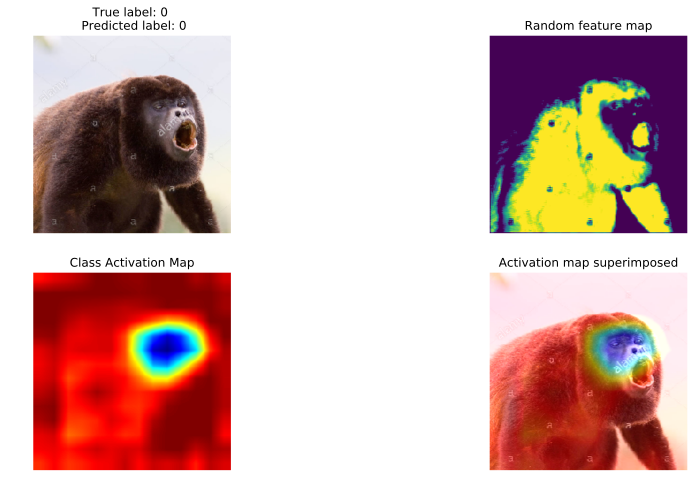

In [21]:
# Get the intermediate activations and plot the heatmap first
activations= show_random_sample(123)

In [22]:
def visualize_intermediate_activations(layer_names, activations):
    """
    This function is used to visualize all the itermediate activation maps
    
    Arguments:
        layer_names: list of names of all the intermediate layers we chose
        activations: all the intermediate activation maps 
    """
    assert len(layer_names)==len(activations), "Make sure layers and activation values match"
    images_per_row=16
    
    for layer_name, layer_activation in zip(layer_names, activations):
        nb_features = layer_activation.shape[-1]
        size= layer_activation.shape[1]

        nb_cols = nb_features // images_per_row
        grid = np.zeros((size*nb_cols, size*images_per_row))

        for col in range(nb_cols):
            for row in range(images_per_row):
                feature_map = layer_activation[0,:,:,col*images_per_row + row]
                feature_map -= feature_map.mean()
                feature_map /= feature_map.std()
                feature_map *=255
                feature_map = np.clip(feature_map, 0, 255).astype(np.uint8)

                grid[col*size:(col+1)*size, row*size:(row+1)*size] = feature_map

        scale = 1./size
        plt.figure(figsize=(scale*grid.shape[1], scale*grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(grid, aspect='auto', cmap='viridis')
    plt.show()

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide


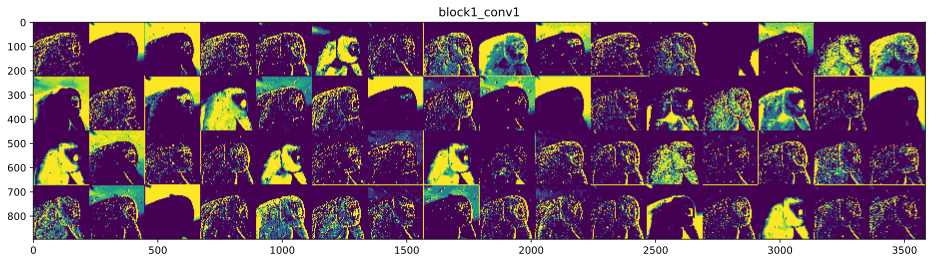

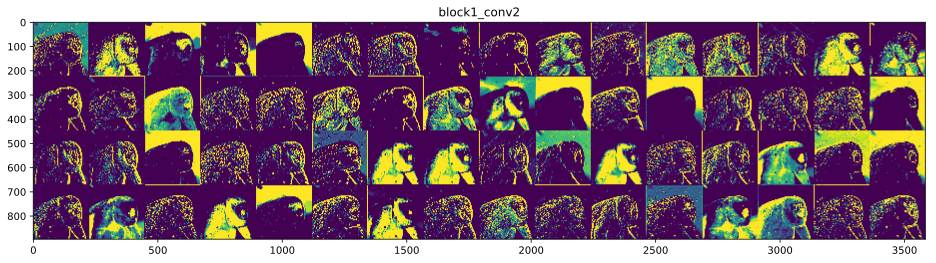

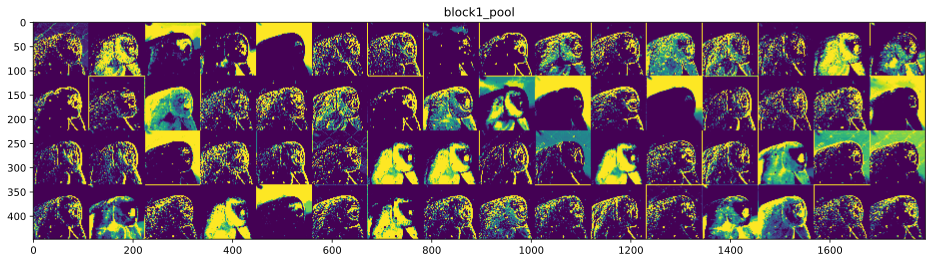

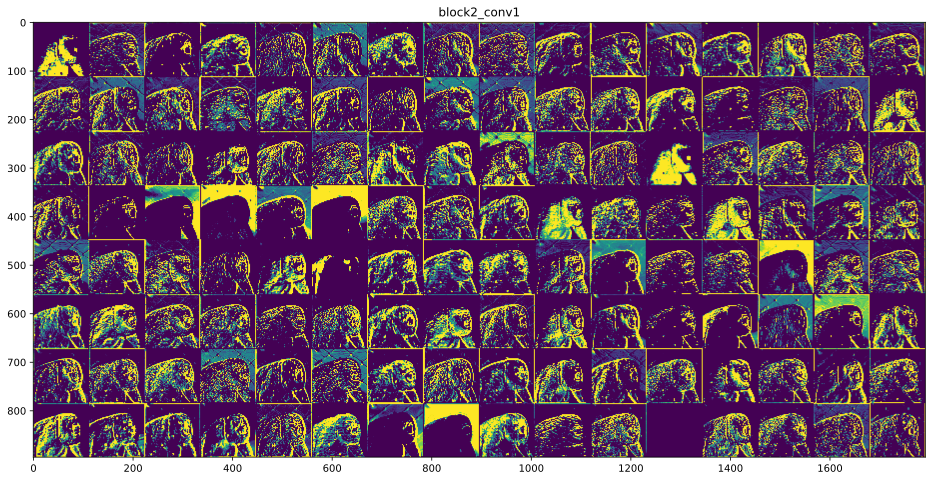

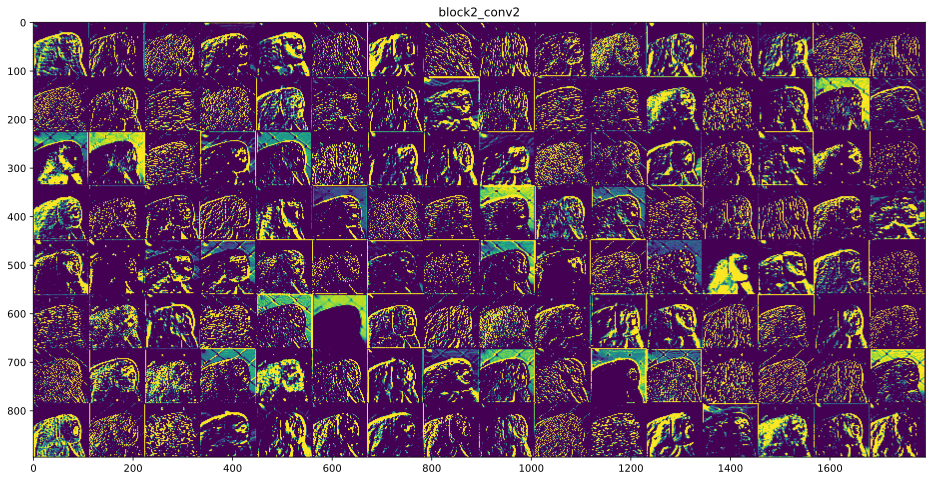

...

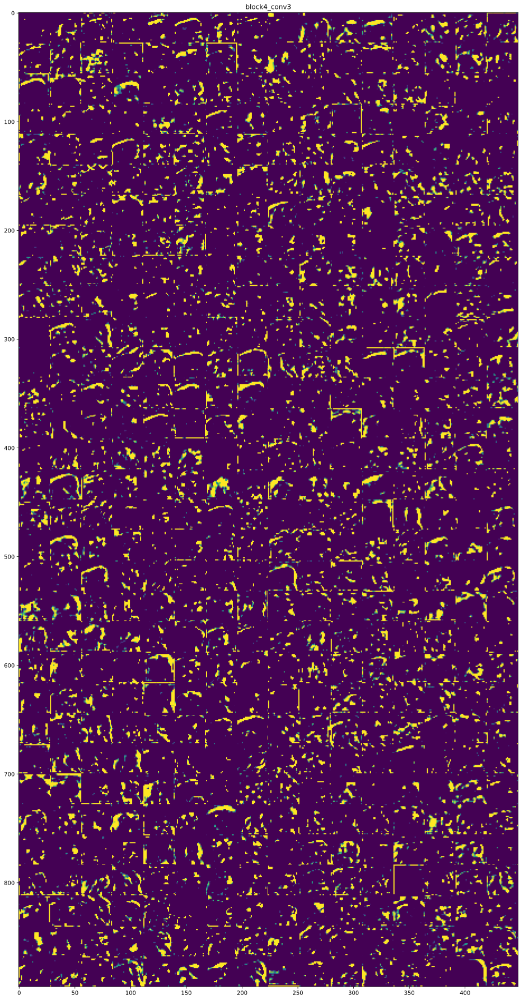

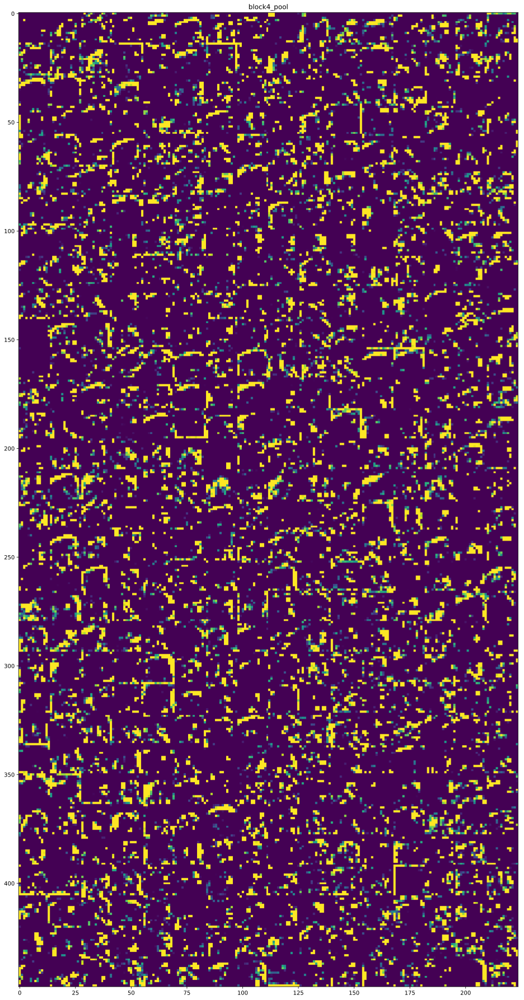

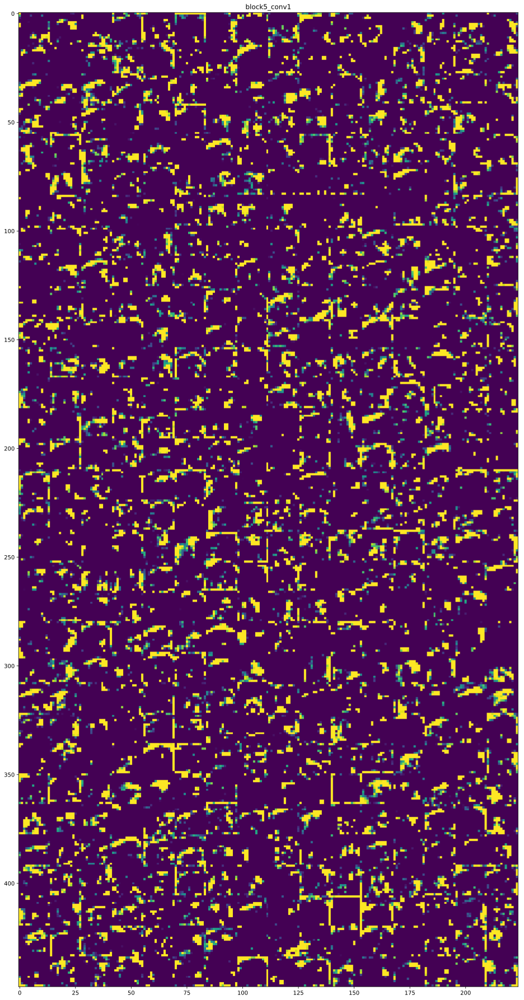

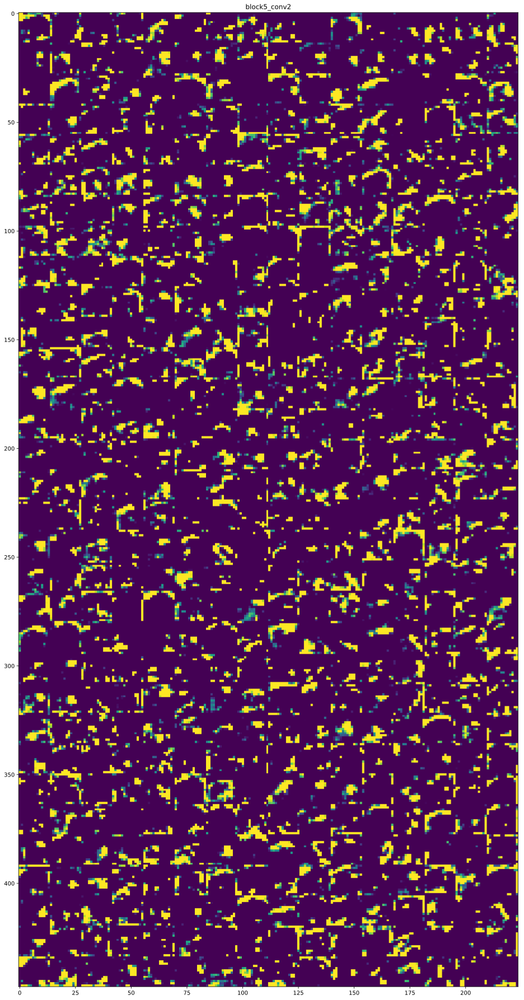

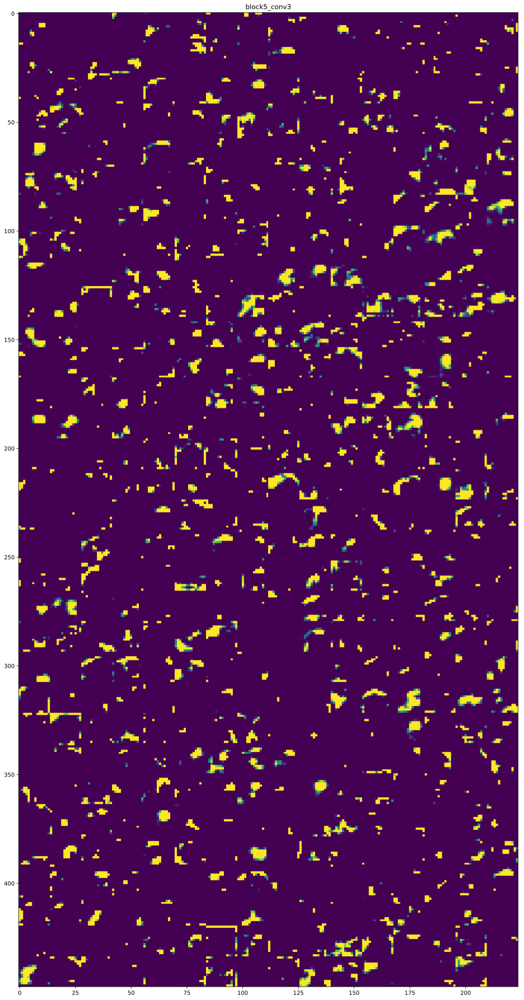

In [23]:
# visualize all the activation maps for this sample
visualize_intermediate_activations(activations=activations, layer_names=layer_names)

**Pretty cool!!**, isn't it? Let's check the **CAM** for few more samples now 

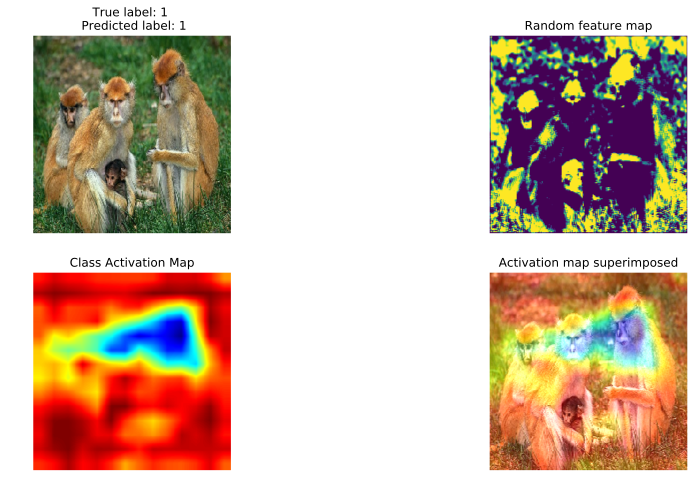

In [24]:
sample_idx=200
activations= show_random_sample(sample_idx)

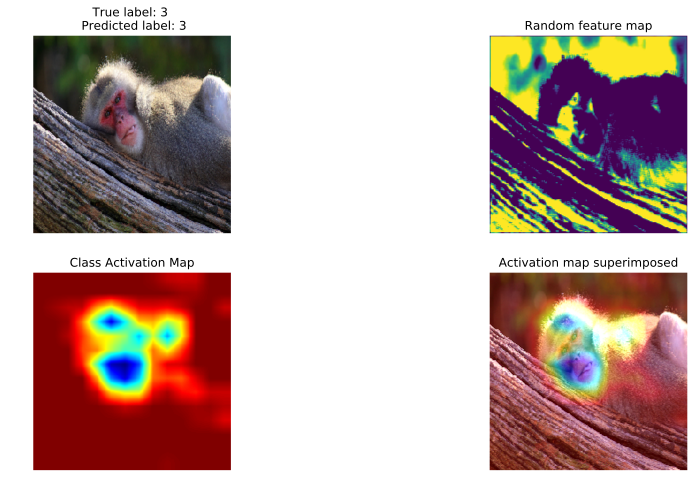

In [25]:
sample_idx=10
activations= show_random_sample(sample_idx)

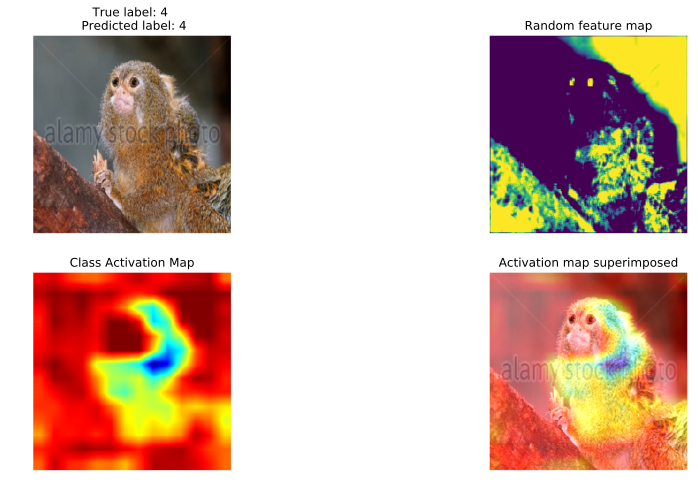

In [26]:
sample_idx=55
activations= show_random_sample(sample_idx)

<a id="conclusion"></a>
## 8. Conclusion

Machine learning models aren't pure black box. You have to figure out how you can make the predictions interpretable. It is not an easy task at all but the on-going research in this area will lead to better ways of interpretability in the nearby future. 

I hope you enjoyed the kernel. Let me know if you have any suggestions. Happy Kaggling!